In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


In [ ]:
# Load data
url = "https://github.com/ArinB/MSBA-CA-Data/blob/main/CA03/census_data.csv?raw=true"
data = pd.read_csv(url, encoding = "ISO-8859-1")
print("The shape of the data: ", data.shape)
data.head(10)

The shape of the data:  (48842, 11)


,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0
5,b. 31-40,e. High,c. High,a. = 0,b. Mid,d. 14,d. Masters,b. income,d. 36-40 & 56-60,train,0
6,a. 0-30,a. Low,b. Mid,a. = 0,a. Low,a. 0-8,a. Low,b. income,e. 40-55,train,0
7,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train,1
8,d. 41-50 & 61-70,e. High,b. Mid,c. > 0,b. Mid,d. 14,d. Masters,b. income,c. 31-35 & 61-70,train,1
9,b. 31-40,e. High,c. High,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,1


# Part I


### 1. Data Quality Analytics (DQA)
Do all of these inside your Notebook: <br>
• Perform a Data Quality Analysis to find missing values, outliers, NaNs etc.<br>
• Display descriptive statistics of each column <br>
• Perform necessary data cleansing and transformation based on your
observations from the data quality analysis <br>
https://towardsdatascience.com/an-introduction-to-discretization-in-data-science-55ef8c9775a2

In [ ]:
# find missing values
data.isnull().sum()

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

In [ ]:
# Descriptive statistics for each column
for column in data:   # iterate through columns
  print("Value counts of:", column)
  print(data[column].value_counts())
  print("-"*40)

Value counts of: hours_per_week_bin
b. 31-40            26639
d. 41-50 & 61-70     9819
a. 0-30              7851
e. 51-60             3759
c. 71-100             774
Name: hours_per_week_bin, dtype: int64
----------------------------------------
Value counts of: occupation_bin
c. Mid - Mid     13971
b. Mid - Low     12947
e. High          12258
a. Low            7237
d. Mid - High     2429
Name: occupation_bin, dtype: int64
----------------------------------------
Value counts of: msr_bin
c. High    22047
b. Mid     15868
a. Low     10927
Name: msr_bin, dtype: int64
----------------------------------------
Value counts of: capital_gl_bin
a. = 0    42525
c. > 0     4035
b. < 0     2282
Name: capital_gl_bin, dtype: int64
----------------------------------------
Value counts of: race_sex_bin
c. High    29737
b. Mid     16457
a. Low      2648
Name: race_sex_bin, dtype: int64
----------------------------------------
Value counts of: education_num_bin
b. 9-12    30324
c. 13       8025
a. 0-8

### 2. Exploratory Data Analysis (EDA)
First, understand the data. Open the .csv file in an Excel spreadsheet and study the 
data columns and the data visually. Then, perform EDA (in your Notebook) of the 
income group with respect to the seven explanatory variables and display graphical 
representations as shown below. Before you do the EDA, you need to do transform 
the data into “categorical” columns by doing the “data binning” with respect to 
SEVEN explanatory variables and their specified number of “bins”. You will also find 
the “bin” value ranges for each of the seven variables in the graphs. If your EDA 
data transformation and graphing code is correct the output of your EDA will look 
like the graphs displayed below. Do all of these inside your Notebook. (Hint: Use 
Stacked Bar Chart options in MatPlotLib).

y                      0      1
age_bin                        
a. 0-25            98.24   1.76
b. 26-30 & 71-100  86.14  13.86
c. 31-35 & 61-70   75.73  24.27
d. 36-40 & 56-60   66.90  33.10
e. 40-55           61.81  38.19


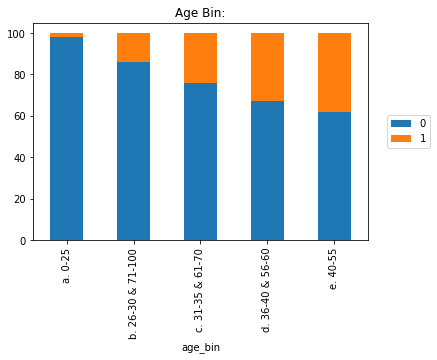

In [ ]:
# stack bar for age
plt_data = data.groupby(['age_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Age Bin:')
plt.legend(loc='right', bbox_to_anchor=(1.2, 0.5))

y                   0      1
capital_gl_bin              
a. = 0          81.07  18.93
b. < 0          49.87  50.13
c. > 0          38.27  61.73


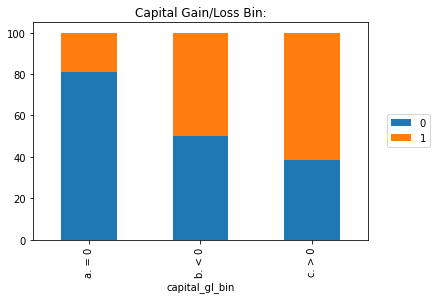

In [ ]:
# stack bar for capital gain / loss
plt_data = data.groupby(['capital_gl_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Capital Gain/Loss Bin:')
plt.legend(loc='right', bbox_to_anchor=(1.2, 0.5))

y                  0      1
education_bin              
a. Low         94.29   5.71
b. Mid         81.86  18.14
c. Bachelors   58.72  41.28
d. Masters     45.09  54.91
e. High        26.61  73.39


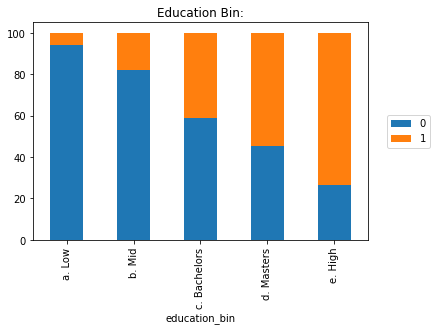

In [ ]:
# stack bar for education
plt_data = data.groupby(['education_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Education Bin:')
plt.legend(loc='right', bbox_to_anchor=(1.2, 0.5))

y                       0      1
hours_per_week_bin              
a. 0-30             93.30   6.70
b. 31-40            79.66  20.34
c. 71-100           65.50  34.50
d. 41-50 & 61-70    60.78  39.22
e. 51-60            56.80  43.20


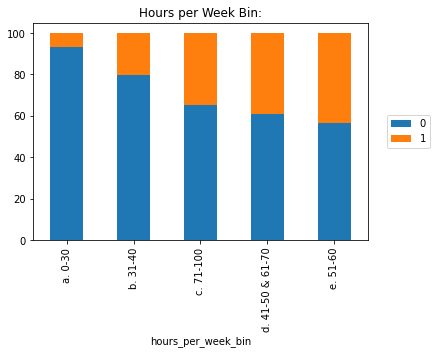

In [ ]:
# stack bar for hours per week
plt_data = data.groupby(['hours_per_week_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Hours per Week Bin:')
plt.legend(loc='right', bbox_to_anchor=(1.2, 0.5))

y            0      1
msr_bin              
a. Low   98.39   1.61
b. Mid   90.09   9.91
c. High  54.92  45.08


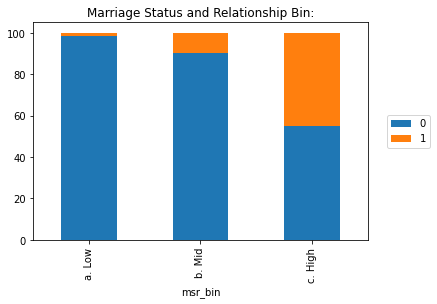

In [ ]:
# stack bar for marriage status and relationship
plt_data = data.groupby(['msr_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Marriage Status and Relationship Bin:')
plt.legend(loc='right', bbox_to_anchor=(1.2, 0.5))

y                   0      1
occupation_bin              
a. Low          95.23   4.77
b. Mid - Low    87.77  12.23
c. Mid - Mid    76.10  23.90
d. Mid - High   70.03  29.97
e. High         53.57  46.43


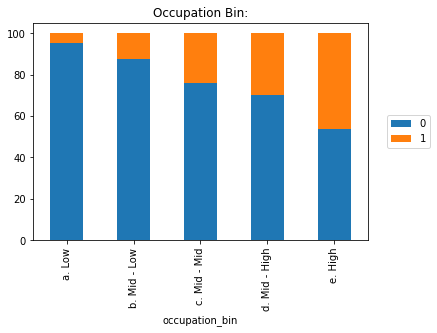

In [ ]:
# stack bar for occupation
plt_data = data.groupby(['occupation_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Occupation Bin:')
plt.legend(loc='right', bbox_to_anchor=(1.2, 0.5))

y                 0      1
race_sex_bin              
a. Low        94.03   5.97
b. Mid        87.09  12.91
c. High       68.37  31.63


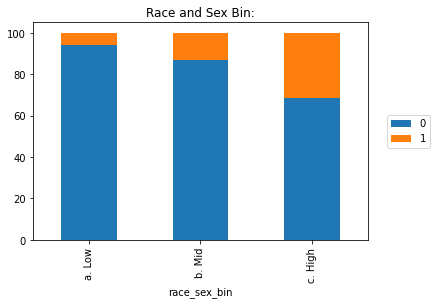

In [ ]:
# stack bar for race and sex
plt_data = data.groupby(['race_sex_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Race and Sex Bin:')
plt.legend(loc='right', bbox_to_anchor=(1.2, 0.5))

There is clear imbalance of the two class. We need to sample the negative data to balance the dataset.

In [ ]:
# The positive and negative data do not balance
print(data[data['y']==1].shape)
print(data[data['y']==0].shape)

(11687, 11)
(37155, 11)


In [ ]:
# sample 11687 from the negative data and append them with the positive data
sample_0 = data[data['y'] == 0].sample(n = 11687, replace = False, random_state = 120)
data = data[data['y'] == 1].append(sample_0)
data.shape

(23374, 11)

# Part II

### 3. Build Decision Tree Classifier Models <br>
**Definition**: Given a data of attributes together with its classes, a decision tree 
produces a sequence of rules that can be used to classify the data.<br><br>
**Advantages**: Decision Tree is simple to understand and visualize, requires little data 
preparation, and can handle both numerical and categorical data.<br><br>
**Disadvantages**: Decision tree can create complex trees that do not generalize well, 
and decision trees can be unstable because small variations in the data might result in 
a completely different tree being generated.<br><br>
Use “DecisionTreeClassifier” algorithm from scikit learn. Find details of sklearn tree 
algorithm below. Scitkit Learn implements an optimized version of CART algorithm and 
can be used for binary class as well as multi-class classifications. It can be used for 
classification, as well as regression. Study the following link thoroughly, including 
Section 1.10.5 (Tips on Practical Use)<br>
https://scikit-learn.org/stable/modules/tree.html#tree-algorithms-id3-c4-5-c5-0-and-cart

In [ ]:
# splitling train and test mannually
x_cols = ['hours_per_week_bin',	'occupation_bin', 'msr_bin',	'capital_gl_bin',	'race_sex_bin',	'education_num_bin',	'education_bin',	'workclass_bin',	'age_bin']
train_data = data[data.flag == 'train']
test_data = data[data.flag == 'test']
X_train = train_data[x_cols]
y_train = train_data['y']
X_test = test_data[x_cols]
y_test = test_data['y']
print(X_train.head())
print(y_train.head())
print(X_test.head())
print(y_test.head())

   hours_per_week_bin occupation_bin  ... workclass_bin            age_bin
7    d. 41-50 & 61-70        e. High  ...     b. income           e. 40-55
8    d. 41-50 & 61-70        e. High  ...     b. income   c. 31-35 & 61-70
9            b. 31-40        e. High  ...     b. income           e. 40-55
10          c. 71-100        e. High  ...     b. income   d. 36-40 & 56-60
11           b. 31-40        e. High  ...     b. income  b. 26-30 & 71-100

[5 rows x 9 columns]
7     1
8     1
9     1
10    1
11    1
Name: y, dtype: int64
      hours_per_week_bin occupation_bin  ... workclass_bin            age_bin
32563           b. 31-40  d. Mid - High  ...     b. income  b. 26-30 & 71-100
32564           b. 31-40   b. Mid - Low  ...     b. income           e. 40-55
32568           b. 31-40        e. High  ...     b. income   c. 31-35 & 61-70
32571           b. 31-40   b. Mid - Low  ...     b. income   c. 31-35 & 61-70
32575   d. 41-50 & 61-70   b. Mid - Low  ...     b. income           e. 40-5

In [ ]:
X_train.to_csv('x1.csv')

In [ ]:
# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(data[x_cols], data['y'])
# print(X_train.head())
# print(y_train.head())
# print(X_test.head())
# print(y_test.head())

In [ ]:
# install category_encoders
!pip install category_encoders

     |████████████████████████████████| 82 kB 460 kB/s 


In [ ]:
# using ordinal encoder to convert string variables into float variable because Decision tree classifier cannot take strings as input
import category_encoders as ce
encoder = ce.OrdinalEncoder(cols = x_cols)
X_train = encoder.fit_transform(X_train)
X_test = encoder.transform(X_test)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
X_train.to_csv('x2.csv')

In [ ]:
# Examine X_train, X_test
print(X_train.head())
print(X_test.head())

    hours_per_week_bin  occupation_bin  ...  workclass_bin  age_bin
7                    1               1  ...              1        1
8                    1               1  ...              1        2
9                    2               1  ...              1        1
10                   3               1  ...              1        3
11                   2               1  ...              1        4

[5 rows x 9 columns]
       hours_per_week_bin  occupation_bin  ...  workclass_bin  age_bin
32563                   2               3  ...              1        4
32564                   2               4  ...              1        1
32568                   2               1  ...              1        2
32571                   2               4  ...              1        2
32575                   1               4  ...              1        1

[5 rows x 9 columns]


In [ ]:
for column in X_train:   # iterate through columns
  print("Value counts of:", column)
  print(data[column].value_counts())
  print("-"*40)

Value counts of: hours_per_week_bin
b. 31-40            12119
d. 41-50 & 61-70     5706
a. 0-30              2799
e. 51-60             2312
c. 71-100             438
Name: hours_per_week_bin, dtype: int64
----------------------------------------
Value counts of: occupation_bin
e. High          7808
c. Mid - Mid     6671
b. Mid - Low     5121
a. Low           2490
d. Mid - High    1284
Name: occupation_bin, dtype: int64
----------------------------------------
Value counts of: msr_bin
c. High    13742
b. Mid      6108
a. Low      3524
Name: msr_bin, dtype: int64
----------------------------------------
Value counts of: capital_gl_bin
a. = 0    18886
c. > 0     2994
b. < 0     1494
Name: capital_gl_bin, dtype: int64
----------------------------------------
Value counts of: race_sex_bin
c. High    15812
b. Mid      6639
a. Low       923
Name: race_sex_bin, dtype: int64
----------------------------------------
Value counts of: education_num_bin
b. 9-12    13343
c. 13       4787
a. 0-8     

In [ ]:
# instatiate the DecisionTreeClassifier model with criterion gini index
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(max_depth = 10, random_state = 120,
                               max_features = None, min_samples_leaf = 15)
dtree.fit(X_train, y_train)
y_pred = dtree.predict(X_test)

### 4. Visualize Your Decision Tree using GraphViz

Get the detail of how to do this from the following link: <br>
https://medium.com/@rnbrown/creating-and-visualizing-decision-trees-with-python-f8e8fa394176

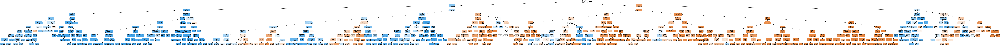

In [ ]:
from six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,
                feature_names=X_train.columns,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### 5. Evaluate Decision Tree Performance <br>
Calculate and display the following. Do all of these inside your Notebook. <br>
• Confusion Matrix (TP, TN, FP, FN … etc.) <br>
• Accuracy, Precision, Recall, F1 Score, AUC Value, ROC Curve (graph)<br>

In [ ]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, y_pred)
print(cf_matrix)

[[2959  931]
 [ 559 3287]]


In [ ]:
# Accuracy score
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)

0.8073940020682523


In [ ]:
# Precision score
from sklearn.metrics import precision_score
precision = precision_score(y_test, y_pred)
print(precision)

0.7792792792792793


In [ ]:
# Recall
from sklearn.metrics import recall_score
recall = recall_score(y_test, y_pred)
print(recall)

0.8546541861674467


In [ ]:
# F1 Score
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_pred)
print(f1_score)

0.8152281746031748


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


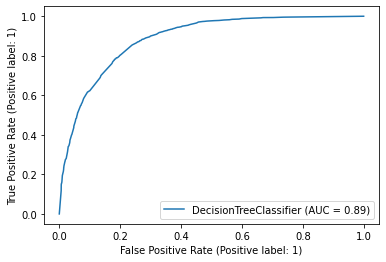

In [ ]:
# ROC Curve and AUC
from sklearn.metrics import plot_roc_curve
plot_roc_curve(dtree, X_test, y_test) 
plt.show()

# Part III

### 6. Tune Decision Tree Performance <BR>
Learn about all hyper-parameters and methods of Scikit Learn DecisionTreeClassifier 
algorithm at: <BR>
https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier <BR>


In [ ]:
# Tree tuning
criterion = 'entropy'
min_samples_split = 55
min_samples_leaf = 15
max_depth = 15

dtree = DecisionTreeClassifier(criterion = criterion, max_depth = max_depth, random_state = 120, min_samples_split = min_samples_split,
                               max_features = None, min_samples_leaf = min_samples_leaf)
dtree.fit(X_train, y_train)
y_pred = dtree.predict(X_test)

# accuracy
accuracy = accuracy_score(y_test, y_pred)
# recall
recall = recall_score(y_test, y_pred)
# Precision
precision = precision_score(y_test, y_pred)
# F1 Score
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_pred)
print('Accuracy: ', accuracy)
print('Recall: ', recall)
print('Precision: ', precision)
print('F1 Score: ', f1_score)

Accuracy:  0.8084281282316442
Recall:  0.8393135725429017
Precision:  0.7888563049853372
F1 Score:  0.8133030990173847


### 7. Conclusion <br>
Explain your observations from the above performance tuning effort.<br>
Q.8.1 How long was your total run time to train the model? <br>
- A: Less than 1 second per training

Q.8.2 Did you find the BEST TREE? <br>
- A: Somewhat. The best combination of hyperparameters is:
>criterion = 'gini'<br>
min_samples_split = 55<br>
min_samples_leaf = 15<br>
max_depth = 15<br>

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; It returns the followering metrics: 
> accuracy: 0.808 <br>
recall: 0.839 <br>
precision: 0.788 <br>
F1 score: 0.813


Q.8.3 Draw the Graph of the BEST TREE Using GraphViz<br>
- A: in the following code block

Q.8.4 What makes it the best tree?<br>
A: The best tree has the highest overall metrics. Although for one metrics to be higher, sometimes we need to sacrifies other metrics

In [ ]:
# graph the best tree
best_dtree = DecisionTreeClassifier(criterion = 'gini', max_depth = 15, random_state = 120, min_samples_split = 55,
                               max_features = None, min_samples_leaf = 15)
best_dtree.fit(X_train, y_train)

dot_data = StringIO()
export_graphviz(best_dtree, out_file=dot_data,
                feature_names=X_train.columns,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# Part IV

### 8. Automation of Performance Tuning <br>
Instead of running your program manually eight times for eight cases, can you 
“automate” generation of the above “Hyperparameter Vs. Model Performance Table” in your code itself, so that the completed performance table can be displayed with all eight cases by running it only once?

In [ ]:
# auto tuning use data from a csv file
autotune = pd.read_csv('autotune.csv')
autotune

for i in autotune.index:
  print('Hyperparameters: ')
  print('Split Criteria: ', autotune.split_criteria[i])
  print('Minimum Sample Split: ', autotune.min_sample_split[i])
  print('Minimum Sample leaf: ', autotune.min_sample_leaf[i])
  print('Minimum Sample leaf: ', autotune.max_depth[i])

  criterion = autotune.split_criteria[i]
  min_samples_split = autotune.min_sample_split[i]
  min_samples_leaf = autotune.min_sample_leaf[i]
  max_depth = autotune.max_depth[i]

  dtree = DecisionTreeClassifier(criterion = criterion, max_depth = max_depth, random_state = 120, min_samples_split = min_samples_split,
                               max_features = None, min_samples_leaf = min_samples_leaf)
  dtree.fit(X_train, y_train)
  y_pred = dtree.predict(X_test)

  # accuracy
  accuracy = accuracy_score(y_test, y_pred)
  # recall
  recall = recall_score(y_test, y_pred)
  # Precision
  precision = precision_score(y_test, y_pred)
  # F1 Score
  from sklearn.metrics import f1_score
  f1_score = f1_score(y_test, y_pred)
  print('Accuracy: ', accuracy)
  print('Recall: ', recall)
  print('Precision: ', precision)
  print('F1 Score: ', f1_score)
  print('-'*40)

Hyperparameters: 
Split Criteria:  gini
Minimum Sample Split:  2
Minimum Sample leaf:  1
Minimum Sample leaf:  5
Accuracy:  0.7951137538779731
Recall:  0.87467498699948
Precision:  0.7530781284978733
F1 Score:  0.8093347768555275
----------------------------------------
Hyperparameters: 
Split Criteria:  gini
Minimum Sample Split:  2
Minimum Sample leaf:  15
Minimum Sample leaf:  10
Accuracy:  0.8073940020682523
Recall:  0.8546541861674467
Precision:  0.7792792792792793
F1 Score:  0.8152281746031748
----------------------------------------
Hyperparameters: 
Split Criteria:  gini
Minimum Sample Split:  10
Minimum Sample leaf:  20
Minimum Sample leaf:  10
Accuracy:  0.8082988624612203
Recall:  0.8629745189807593
Precision:  0.7763742690058479
F1 Score:  0.8173870213027953
----------------------------------------
Hyperparameters: 
Split Criteria:  gini
Minimum Sample Split:  55
Minimum Sample leaf:  15
Minimum Sample leaf:  15
Accuracy:  0.8082988624612203
Recall:  0.8406136245449818
Prec

In [ ]:
# define a function for auto tuning with for loop to loop through different hyperparameters and find best tree
def auto_tuning(split_criteria, min_samples_split, min_samples_leaf, max_depth):
  # create an empty dataframe for recording tuning cases
  df_tuning = pd.DataFrame(columns = ['split_criteria', 'min_samples_split', 'min_samples_leaf', 'max_depth',
                                      'accuracy', 'recall', 'precision', 'f1_score'])
  for sc in split_criteria:
    for ms in min_samples_split:
      for ml in min_samples_leaf:
        for md in max_depth:
          # train tree
          dtree = DecisionTreeClassifier(criterion = sc, max_depth = md, random_state = 120, 
                                         min_samples_split = ms, max_features = None, min_samples_leaf = ml)
          dtree.fit(X_train, y_train)
          # predict
          y_pred = dtree.predict(X_test)
          # get scores:
          # accuracy
          accuracy = accuracy_score(y_test, y_pred)
          # recall
          recall = recall_score(y_test, y_pred)
          # Precision
          precision = precision_score(y_test, y_pred)
          # F1 Score
          from sklearn.metrics import f1_score
          f1_score = f1_score(y_test, y_pred)
          df_tuning = df_tuning.append(
              {
                'split_criteria':sc, 
                'min_samples_split':ms, 
                'min_samples_leaf':ml, 
                'max_depth':md,
                'accuracy':accuracy, 
                'recall':recall, 
                'precision':precision, 
                'f1_score':f1_score
              }, ignore_index = True
          )
  return df_tuning
          
  

In [ ]:
# input range of hyperparameters for tuning
split_criteria = ['gini', 'entropy']
min_samples_split = range(2, 50, 2)
min_samples_leaf = range(1, 50, 2)
max_depth = range(2, 50, 2)

records = auto_tuning(split_criteria=split_criteria, min_samples_split = min_samples_split, 
                      min_samples_leaf = min_samples_leaf, max_depth = max_depth)
records[0:10]

# runtime 16 min

,split_criteria,min_samples_split,min_samples_leaf,max_depth,accuracy,recall,precision,f1_score
0,gini,2,1,2,0.771975,0.909516,0.711844,0.798630
1,gini,2,1,4,0.790460,0.871035,0.748603,0.805192
2,gini,2,1,6,0.799767,0.857774,0.767031,0.809869
3,gini,2,1,8,0.804679,0.851274,0.777118,0.812508
4,gini,2,1,10,0.806489,0.851794,0.779443,0.814014
5,gini,2,1,12,0.807265,0.855434,0.778698,0.815265
6,gini,2,1,14,0.802999,0.826053,0.787946,0.806550
7,gini,2,1,16,0.802482,0.823973,0.788308,0.805746
8,gini,2,1,18,0.801189,0.821893,0.787494,0.804326
9,gini,2,1,20,0.801319,0.821893,0.787690,0.804428


In [ ]:
# extract best tree
records.iloc[records['f1_score'].idxmax(), :]

split_criteria        entropy
min_samples_split           2
min_samples_leaf           37
max_depth                  12
accuracy             0.808816
recall               0.880135
precision            0.768794
f1_score             0.820706
Name: 14837, dtype: object

In [ ]:
# a new best tree
best_dtree = DecisionTreeClassifier(criterion = 'gini', max_depth = 12, random_state = 120, min_samples_split = 2,
                               max_features = None, min_samples_leaf = 37)
best_dtree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=12, min_samples_leaf=37, random_state=120)

Here is a new best tree: <br>
>criterion = 'gini'<br>
min_samples_split = 2<br>
min_samples_leaf = 37<br>
max_depth = 12<br>


> accuracy: 0.809 <br>
recall: 0.88 <br>
precision: 0.768 <br>
F1 score: 0.821

# Part V

### 9. Prediction using your “trained” Decision Tree Model <br>
Based on the Performance Tuning effort in the previous section, pick your BEST 
PERFORMING TREE. Now make prediction of a “new” individual’s Income Category ( 
<=50K, or >50K ) with the following information. Do this in your Notebook.

>• Hours Worked per Week = 48<br>
• Occupation Category = Mid - Low<br>
• Marriage Status & Relationships = High<br>
• Capital Gain = Yes<br>
• Race-Sex Group = Mid<br>
• Number of Years of Education = 12<br>
• Education Category = High<br>
• Work Class = Income<br>
• Age = 58<br>


In [ ]:
new_indiv = pd.DataFrame({'hours_per_week_bin':[3],
                        'occupation_bin':[4],
                        'msr_bin':[2],
                        'capital_gl_bin':[1],
                        'race_sex_bin':[2],
                        'education_num_bin':[2],
                        'education_bin':[5],
                        'workclass_bin':[1],
                        'age_bin':[1]})
prediction = best_dtree.predict(new_indiv)
prediction_prob = best_dtree.predict_proba(new_indiv)
print(prediction)
print(prediction_prob)

[0]
[[0.82978723 0.17021277]]


Q.10.1 What is the probability of the outcome of the prediction for this ? What is your decision probability threshold and what is your predicted decision based on that?<br>
A: The probablity of this individual's income would be less 50k is 0.83, and the probability that the income is more than 50k is 0.17 <br>
Q. 10.2 What is the probability that your outcome prediction is accurate? <br>
A: The probability of this prediction is accurate is 0.81